Попытка  запустить код из статьи  https://www.kaggle.com/code/mgmarques/wines-type-and-quality-classification-exercises

In [60]:
%cd .\\script
%run download_data.py

C:\OCV\script


In [2]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
import pylab 
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
from matplotlib import pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.colors import ListedColormap
%matplotlib inline
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
from graphviz import Source
from IPython.display import Image

from scipy.stats import skew, norm, probplot, boxcox, f_oneway
from scipy import interp
from sklearn.base import BaseEstimator, TransformerMixin, clone, ClassifierMixin
from sklearn import metrics, tree
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler, PolynomialFeatures, MinMaxScaler

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score

from sklearn.linear_model import LogisticRegression
from keras.models import Sequential
from keras.layers import Dense

from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
# from sklearn.ensemble.gradient_boosting import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from mlxtend.classifier import StackingClassifier

#from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer
#from skater.core.explanations import Interpretation
#from skater.model import InMemoryModel

Загружаем данные

In [3]:
wines = pd.read_csv('.\\data\winequalityN.csv')

wines['quality_label'] = wines.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 7 else 'high')
#wines.quality_label = pd.Categorical(wines.quality_label, categories=['low', 'medium', 'high'], ordered=True)

# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

In [4]:
wines

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,white,7.3,0.28,0.42,14.4,0.040,49.0,173.0,0.99940,3.28,0.82,9.0,7,medium
1,red,6.9,1.09,0.06,2.1,0.061,12.0,31.0,0.99480,3.51,0.43,11.4,4,low
2,red,9.5,0.46,0.24,2.7,0.092,14.0,44.0,0.99800,3.12,0.74,10.0,6,medium
3,red,8.2,0.31,0.40,2.2,0.058,6.0,10.0,0.99536,3.31,0.68,11.2,7,medium
4,white,7.9,0.28,0.41,4.9,0.058,31.0,153.0,0.99660,3.27,0.51,9.7,6,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,white,6.9,0.19,0.40,1.4,0.036,14.0,55.0,0.99090,3.08,0.68,11.5,7,medium
6493,red,9.3,0.37,0.44,1.6,0.038,21.0,42.0,0.99526,3.24,0.81,10.8,7,medium
6494,white,6.0,0.13,0.28,5.7,0.038,56.0,189.5,0.99480,3.59,0.43,10.6,7,medium
6495,white,6.7,0.30,0.49,4.8,0.034,36.0,158.0,0.99450,3.12,0.45,9.9,6,medium


Исследовательский анализ данных (EDA) 


In [5]:
wines.quality_label.value_counts()

quality_label
medium    3915
low       2384
high       198
Name: count, dtype: int64

In [6]:
wines.dropna().quality_label.value_counts()

quality_label
medium    3894
low       2372
high       197
Name: count, dtype: int64

In [7]:
wines.dropna(inplace=True)

class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

wines = DataFrameImputer().fit_transform(wines)

После обработки нулей мы увидим ниже распределение данных по качествам по их типам и подтверждение дисбаланса между классами, особенно с небольшим количеством случаев высокого качества.

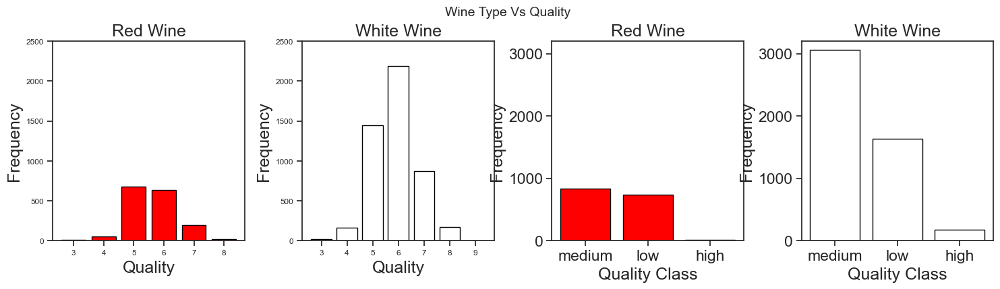

In [8]:
fig = plt.figure(figsize = (18, 4))
title = fig.suptitle("Wine Type Vs Quality", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.3)

ax1 = fig.add_subplot(1,4, 1)
ax1.set_title("Red Wine")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Frequency") 
rw_q = wines.quality[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax1.set_ylim([0, 2500])
ax1.tick_params(axis='both', which='major', labelsize=8.5)
bar1 = ax1.bar(rw_q[0], rw_q[1], color='red', edgecolor='black', linewidth=1)


ax2 = fig.add_subplot(1,4, 2)
ax2.set_title("White Wine")
ax2.set_xlabel("Quality")
ax2.set_ylabel("Frequency") 
ww_q = wines.quality[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax2.set_ylim([0, 2500])
ax2.tick_params(axis='both', which='major', labelsize=8.5)
bar2 = ax2.bar(ww_q[0], ww_q[1], color='white', edgecolor='black', linewidth=1)

ax3 = fig.add_subplot(1,4, 3)
ax3.set_title("Red Wine")
ax3.set_xlabel("Quality Class")
ax3.set_ylabel("Frequency") 
rw_q = wines.quality_label[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax3.set_ylim([0, 3200])
bar3 = ax3.bar(list(range(len(rw_q[0]))), rw_q[1], color='red', edgecolor='black', linewidth=1, tick_label =rw_q[0])

ax4 = fig.add_subplot(1,4, 4)
ax4.set_title("White Wine")
ax4.set_xlabel("Quality Class")
ax4.set_ylabel("Frequency") 
ww_q = wines.quality_label[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax4.set_ylim([0, 3200])
bar4 = ax4.bar(list(range(len(ww_q[0]))), ww_q[1], color='white', edgecolor='black', linewidth=1, tick_label =ww_q[0])

Описательная статистика

In [9]:
subset_attributes = wines.columns
rs = round(wines.loc[wines.type == 'red', subset_attributes].describe(),2)
ws = round(wines.loc[wines.type == 'white', subset_attributes].describe(),2)
pd.concat([rs, ws], axis=0, keys=['Red Wine Statistics', 'White Wine Statistics']).T

Red Wine Statistics                                    \
                                   count   mean    std   min    25%    50%   
fixed acidity                     1593.0   8.33   1.74  4.60   7.10   7.90   
volatile acidity                  1593.0   0.53   0.18  0.12   0.39   0.52   
citric acid                       1593.0   0.27   0.19  0.00   0.09   0.26   
residual sugar                    1593.0   2.54   1.41  0.90   1.90   2.20   
chlorides                         1593.0   0.09   0.05  0.01   0.07   0.08   
free sulfur dioxide               1593.0  15.84  10.44  1.00   7.00  14.00   
total sulfur dioxide              1593.0  46.46  32.91  6.00  22.00  38.00   
density                           1593.0   1.00   0.00  0.99   1.00   1.00   
pH                                1593.0   3.31   0.15  2.74   3.21   3.31   
sulphates                         1593.0   0.66   0.17  0.33   0.55   0.62   
alcohol                           1593.0  10.42   1.07  8.40   9.50  10.20   
quality                           1593.0   5.64   0.81  3.00   5.00   6.00   

                                    White Wine Statistics                 \
                        75%     max                 count    mean    std   
fixed acidity          9.20   15.90                4870.0    6.86   0.84   
volatile acidity       0.64    1.58                4870.0    0.28   0.10   
citric acid            0.42    1.00                4870.0    0.33   0.12   
residual sugar         2.60   15.50                4870.0    6.39   5.07   
chlorides              0.09    0.61                4870.0    0.05   0.02   
free sulfur dioxide   21.00   72.00                4870.0   35.32  17.01   
total sulfur dioxide  62.00  289.00                4870.0  138.34  42.49   
density                1.00    1.00                4870.0    0.99   0.00   
pH                     3.40    4.01                4870.0    3.19   0.15   
sulphates              0.73    2.00                4870.0    0.49   0.11   
alcohol               11.10   14.90                4870.0   10.52   1.23   
quality                6.00    8.00                4870.0    5.88   0.89   

                                                            
                       min     25%     50%     75%     max  
fixed acidity         3.80    6.30    6.80    7.30   14.20  
volatile acidity      0.08    0.21    0.26    0.32    1.10  
citric acid           0.00    0.27    0.32    0.39    1.66  
residual sugar        0.60    1.70    5.20    9.90   65.80  
chlorides             0.01    0.04    0.04    0.05    0.35  
free sulfur dioxide   2.00   23.00   34.00   46.00  289.00  
total sulfur dioxide  9.00  108.00  134.00  167.00  440.00  
density               0.99    0.99    0.99    1.00    1.04  
pH                    2.72    3.09    3.18    3.28    3.82  
sulphates             0.22    0.41    0.47    0.55    1.08  
alcohol               8.00    9.50   10.40   11.40   14.20  
quality               3.00    5.00    6.00    6.00    9.00

In [10]:
#subset_attributes = ['alcohol', 'volatile acidity', 'pH', 'quality']
ls = round(wines[wines['quality_label'] == 'low'][subset_attributes].describe(),2)
ms = round(wines[wines['quality_label'] == 'medium'][subset_attributes].describe(),2)
hs = round(wines[wines['quality_label'] == 'high'][subset_attributes].describe(),2)
pd.concat([ls, ms, hs], axis=0, keys=['Low Quality Wine', 'Medium Quality Wine', 'High Quality Wine']).T

Low Quality Wine                                      \
                                count    mean    std   min    25%     50%   
fixed acidity                  2372.0    7.33   1.27  4.20   6.50    7.10   
volatile acidity               2372.0    0.40   0.19  0.10   0.26    0.34   
citric acid                    2372.0    0.30   0.16  0.00   0.21    0.30   
residual sugar                 2372.0    5.63   4.91  0.60   1.80    2.90   
chlorides                      2372.0    0.06   0.04  0.01   0.04    0.05   
free sulfur dioxide            2372.0   29.48  19.86  2.00  14.00   26.00   
total sulfur dioxide           2372.0  119.21  61.90  6.00  68.00  124.00   
density                        2372.0    1.00   0.00  0.99   0.99    1.00   
pH                             2372.0    3.21   0.16  2.74   3.11    3.20   
sulphates                      2372.0    0.52   0.14  0.25   0.44    0.50   
alcohol                        2372.0    9.87   0.84  8.00   9.30    9.60   
quality                        2372.0    4.88   0.36  3.00   5.00    5.00   

                                     Medium Quality Wine          ...          \
                         75%     max               count    mean  ...     75%   
fixed acidity           7.80   15.90              3894.0    7.17  ...    7.60   
volatile acidity        0.50    1.58              3894.0    0.31  ...    0.36   
citric acid             0.40    1.00              3894.0    0.33  ...    0.39   
residual sugar          8.50   23.50              3894.0    5.33  ...    7.90   
chlorides               0.08    0.61              3894.0    0.05  ...    0.06   
free sulfur dioxide    42.00  289.00              3894.0   30.94  ...   41.00   
total sulfur dioxide  167.00  440.00              3894.0  113.45  ...  150.00   
density                 1.00    1.00              3894.0    0.99  ...    1.00   
pH                      3.31    3.90              3894.0    3.22  ...    3.32   
sulphates               0.58    2.00              3894.0    0.54  ...    0.61   
alcohol                10.40   14.90              3894.0   10.81  ...   11.70   
quality                 5.00    5.00              3894.0    6.28  ...    7.00   

                             High Quality Wine                               \
                         max             count    mean    std    min    25%   
fixed acidity          15.60             197.0    6.85   1.15   3.90   6.20   
volatile acidity        1.04             197.0    0.29   0.12   0.12   0.21   
citric acid             1.66             197.0    0.33   0.10   0.03   0.28   
residual sugar         65.80             197.0    5.37   4.16   0.80   2.00   
chlorides               0.42             197.0    0.04   0.02   0.01   0.03   
free sulfur dioxide   112.00             197.0   34.53  17.12   3.00  24.00   
total sulfur dioxide  294.00             197.0  117.70  41.69  12.00  96.00   
density                 1.04             197.0    0.99   0.00   0.99   0.99   
pH                      4.01             197.0    3.22   0.16   2.88   3.13   
sulphates               1.95             197.0    0.51   0.16   0.25   0.38   
alcohol                14.20             197.0   11.69   1.27   8.50  11.00   
quality                 7.00             197.0    8.03   0.16   8.00   8.00   

                                              
                         50%     75%     max  
fixed acidity           6.80    7.30   12.60  
volatile acidity        0.27    0.35    0.85  
citric acid             0.32    0.36    0.74  
residual sugar          4.10    7.60   14.80  
chlorides               0.04    0.04    0.12  
free sulfur dioxide    34.00   43.00  105.00  
total sulfur dioxide  119.00  145.00  212.50  
density                 0.99    0.99    1.00  
pH                      3.23    3.33    3.72  
sulphates               0.48    0.60    1.10  
alcohol                12.00   12.60   14.00  
quality                 8.00    8.00    9.00  

[12 rows x 24 columns]

In [11]:
def type_inf_stat_test(feature):
    F, p = f_oneway(wines[wines.type == 'red'][feature], 
                    wines[wines.type == 'white'][feature])
    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Acept'
    print('F Statistic: {:.2f} \tp-value: {:.3f} \tNull Hypothesis: {}'.format(F, p, msg))
    
def quality_inf_stat_test(feature):
    F, p = f_oneway(wines[wines.quality_label == 'low'][feature], 
                    wines[wines.quality_label == 'medium'][feature], 
                    wines[wines.quality_label == 'high'][feature])
    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Acept'
    print('F Statistic: {:.2f} \tp-value: {:.3f} \tNull Hypothesis: {}'.format(F, p, msg))

In [12]:
print('Тест ANOVA для образцов вина разных типов:\n')
# - Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.
type_inf_stat_test('residual sugar')
type_inf_stat_test('total sulfur dioxide')
#- Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
type_inf_stat_test('sulphates')
type_inf_stat_test('fixed acidity')
type_inf_stat_test('volatile acidity')
#- From all numbers, we can observe that citric acid is more present in white than red wines.
type_inf_stat_test('citric acid')
#- In general, white wines has half concentrations of chlorides then red wines.
type_inf_stat_test('chlorides')
#- Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.
type_inf_stat_test('pH')

Тест ANOVA для образцов вина разных типов:

F Statistic: 898.19 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 6225.78 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2005.69 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2025.60 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 4812.72 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 231.26 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2304.04 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 781.42 	p-value: 0.000 	Null Hypothesis: Reject


In [13]:
print('Тест ANOVA для образцов вина разного уровня качества:\n')
#- alcohol makes a lot of difference in quality. Although lower quality wines have the lowest standard deviation.
quality_inf_stat_test('alcohol')
#- The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.
quality_inf_stat_test('chlorides')
quality_inf_stat_test('volatile acidity')
#- The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.
quality_inf_stat_test('free sulfur dioxide')
#- Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality
quality_inf_stat_test('fixed acidity')

Тест ANOVA для образцов вина разного уровня качества:

F Statistic: 669.32 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 120.76 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 251.32 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 10.22 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 20.09 	p-value: 0.000 	Null Hypothesis: Reject


In [14]:
# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(wines.type.values) # 1 - White; 0 - Red
wines['color'] = y_tp

class_ql = {'low':0, 'medium': 1, 'high': 2}
y_ql = wines.quality_label.map(class_ql)

Проверим корреляции на основе типов вин.

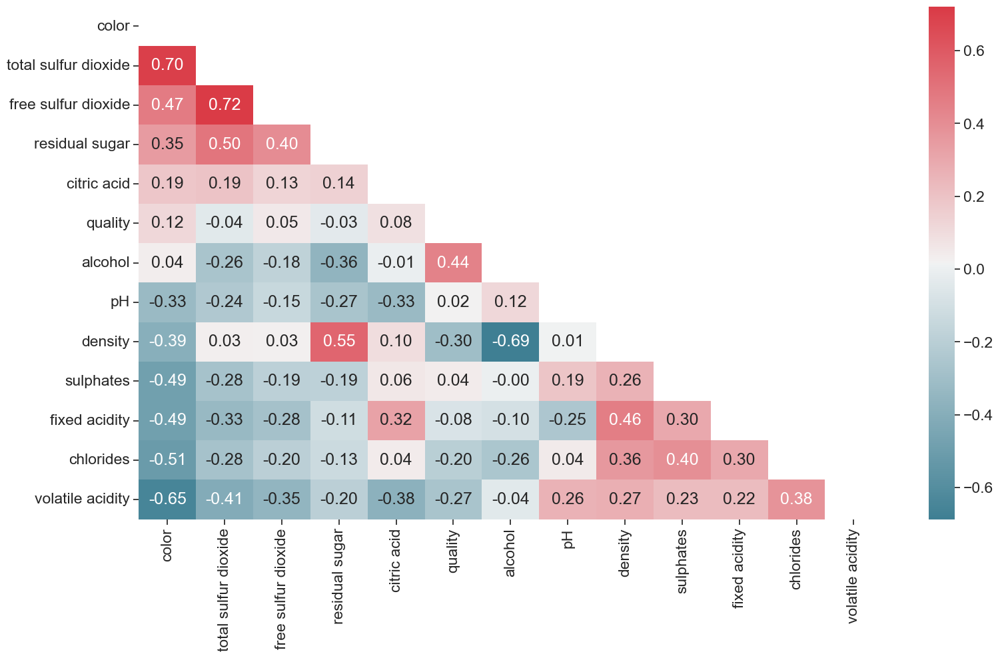

In [15]:
numerical_wines = wines.select_dtypes(include=[np.number])
corr = numerical_wines.corr()
# corr = wines.corr()
top_corr_cols = corr.color.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)
plt.show()
del corr, dropSelf, top_corr

Хотя большинство корреляций слабые, мы видим, что: Общий и свободный диоксид серы имеет наибольшую корреляцию с белыми винами и друг с другом. Фактически, второй является частью первого и представляет собой коллинеарность, которая может быть проблемой для линейных классификаторов, особенно если цель будет предсказывать цвет, и в этом случае нам нужно отбросить свободный диоксид серы. Остаточный сахар имеет половину отношения к общему количеству диоксида серы и 0,40 к общему количеству диоксида серы. Это показатель того, что чем больше остаточного сахара, тем больше диоксида серы добавляет винодел. 0,5 указывает на то, что в белом вине больше остаточного сахара, чем в красном. Densite имеет относительно высокую положительную корреляцию с остаточным сахаром и относительно высокую отрицательную корреляцию с алкоголем. Соотношение хлоридов и летучей кислотности между цветом -0,51 и -0,65 указывает на склонность к классификации красных вин.


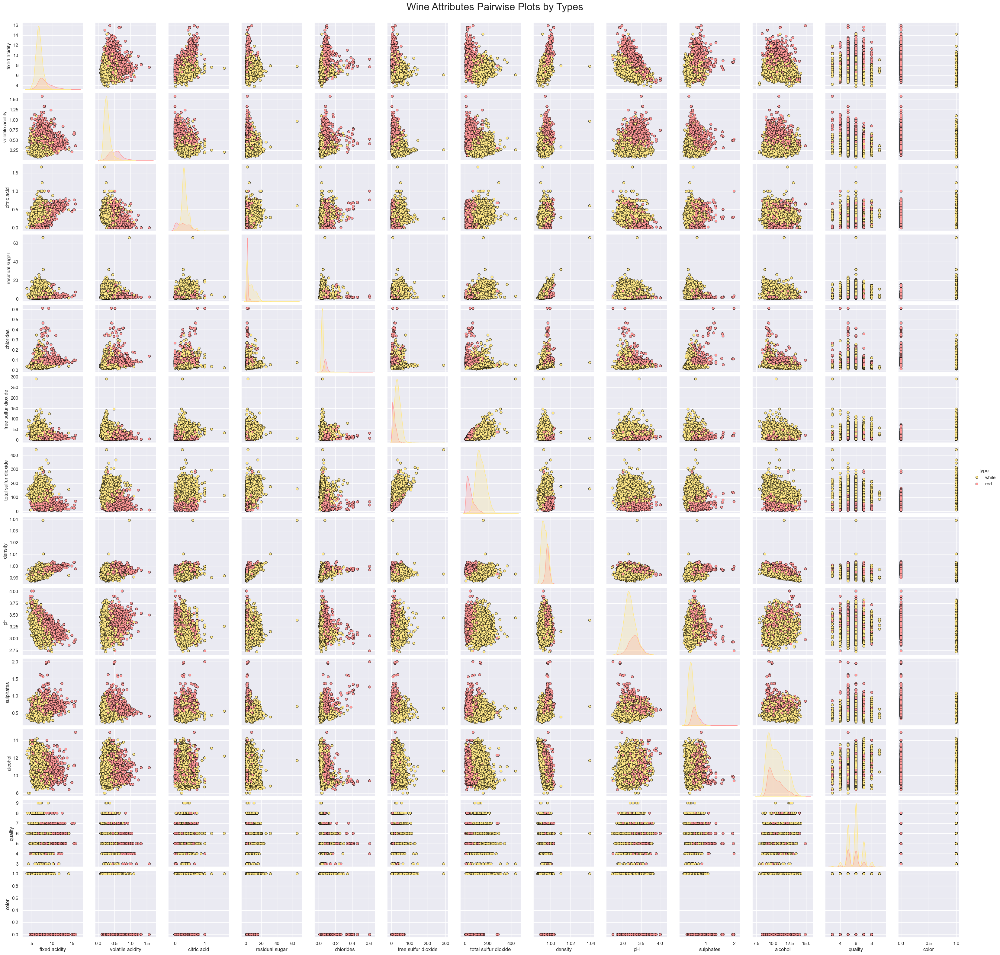

In [16]:
sns.set(font_scale=1.0)
g = sns.pairplot(data = wines, hue='type', palette={'red': '#FF9999', 'white': '#FFE888'},plot_kws=dict(edgecolor='black', linewidth=0.5))
fig = g.fig 
fig.subplots_adjust(top=0.96, wspace=0.2)
t = fig.suptitle('Wine Attributes Pairwise Plots by Types', fontsize=24)

На парном графике выше мы можем заметить несколько интересных закономерностей, которые соответствуют выводам, которые мы получили ранее при тестировании ANOVA и корреляциях. Остаточный сахар, общее количество диоксида серы и лимонной кислоты в белом вине, по-видимому, намного выше, чем в красном вине. Сульфаты, фиксированная кислотность и летучая кислотность в красном вине выше, чем в белом. Плотность имеет слабо сильную отрицательную корреляцию с алкоголем, что подтверждается линейным трендом точек слева направо в сторону уменьшения (вниз). Плотность имеет несколько сильную положительную корреляцию с остаточным сахаром, что подтверждается двумя выбросами белого вина. Давайте посмотрим на корреляционные и парные графики с точки зрения качества:



Провеиме корреляции на основе этикеток качества вин.

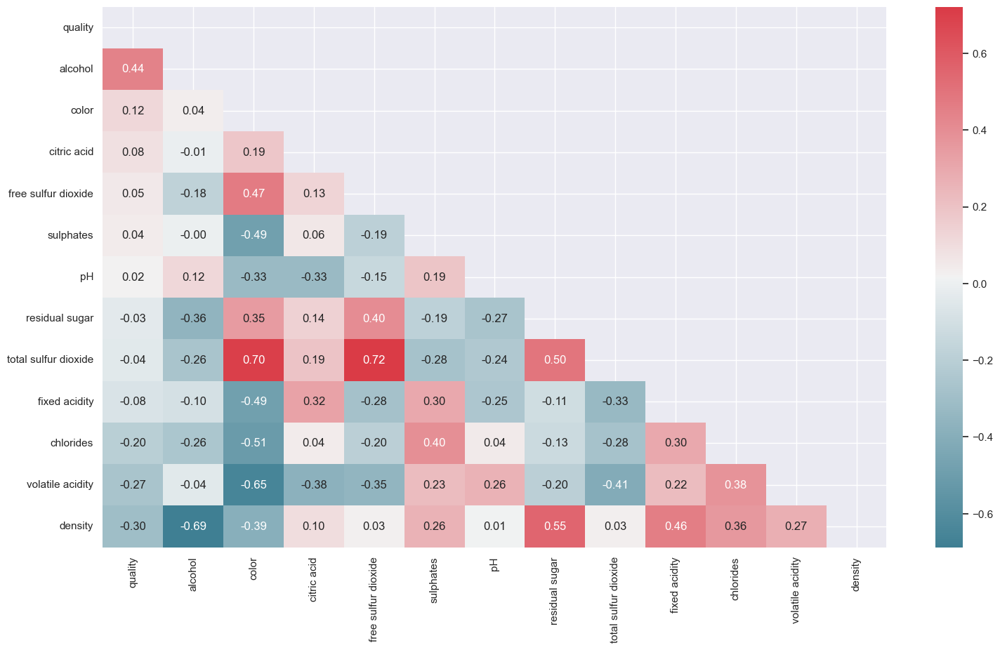

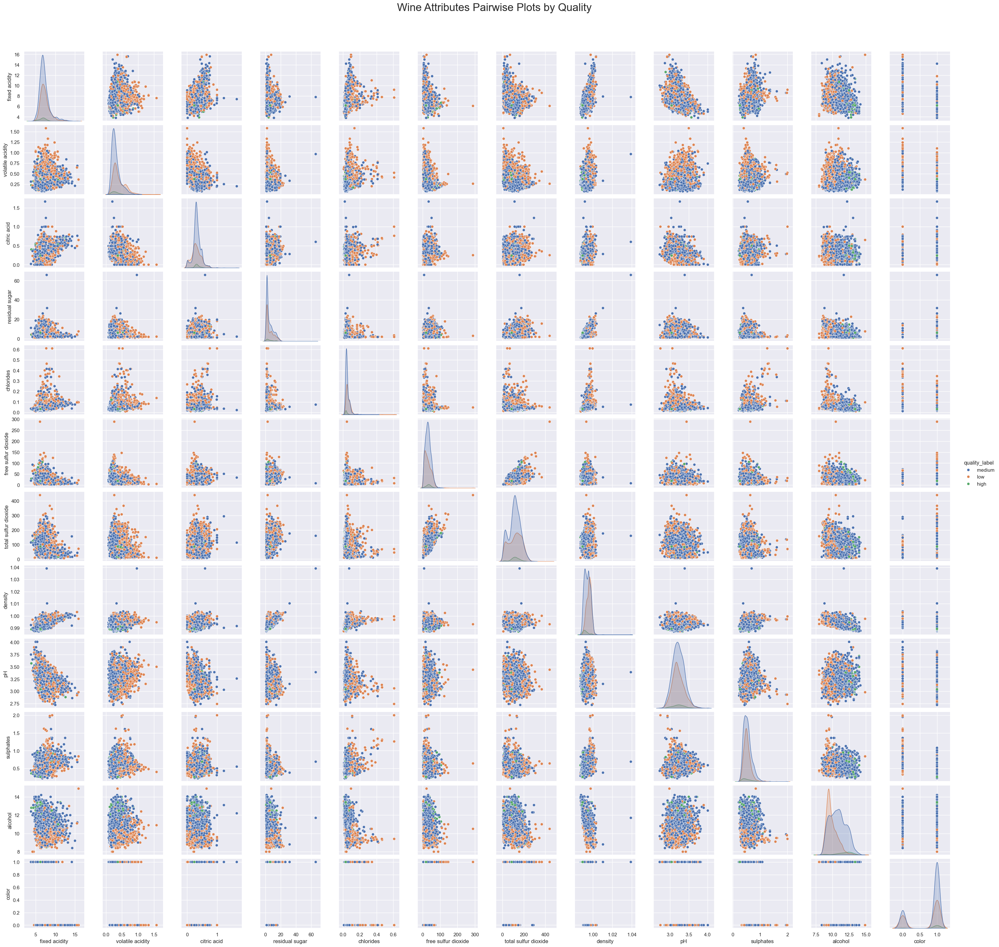

In [17]:
numerical_wines = wines.select_dtypes(include=[np.number])
corr = numerical_wines.corr()
# corr = wines.corr()
top_corr_cols = corr.quality.sort_values(ascending=False).keys() 
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)

sns.set(font_scale=1.0)
cols = wines.columns
cols = cols.drop('quality')
g = sns.pairplot(data = wines.loc[:, cols], hue='quality_label')
fig = g.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Wine Attributes Pairwise Plots by Quality', fontsize=24)

plt.show()

del corr, dropSelf, top_corr, g, fig, t

Опять же, это соответствует выводам, которые мы получили ранее при тестировании ANOVA и корреляциях. Более низкий уровень сульфатов в винах высокого качества, но самый высокий — в винах среднего качества. Более низкий уровень летучих кислот в винах с высокими оценками качества. Самая высокая корреляция, 0,72, наблюдается между общим и свободным диоксидом серы, что и ожидалось, но эти два показателя имеют низкую корреляцию и находятся в противоположных направлениях с качеством. Итак, мы устраним это при необходимости, когда проверим мультиколлинеарность. Опять же, это соответствует выводам, которые мы получили ранее при тестировании ANOVA и корреляциях. Более низкий уровень сульфатов в винах высокого качества, но самый высокий — в винах среднего качества. Более низкий уровень летучих кислот в винах с высокими оценками качества. Давайте посмотрим на соотношение качества вина и его алкоголя:


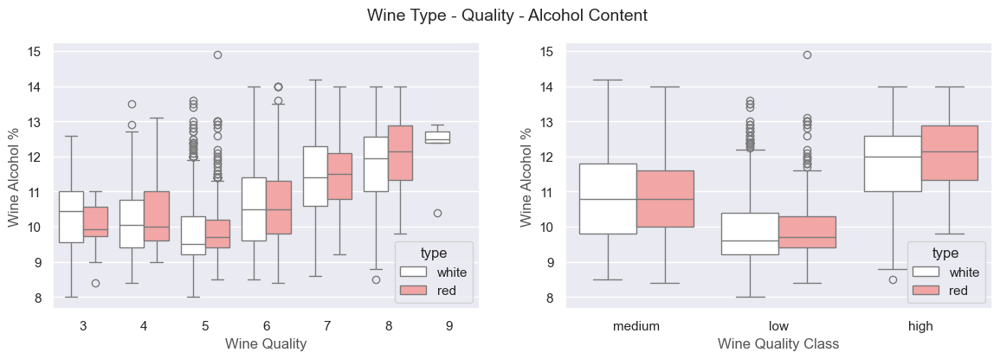

In [18]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Alcohol Content', fontsize=14)

sns.boxplot(x='quality', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)

sns.boxplot(x='quality_label', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)
plt.show()

На каждом квадратичном графике выше показано распределение уровня алкоголя для определенного рейтинга качества вина, разделенное по типам вина. Мы можем ясно наблюдать, что объемное распределение винного спирта имеет тенденцию к увеличению на основе образцов вина с более высоким рейтингом качества, а некоторые отклонения на каждом уровне качества часто обозначаются отдельными баллами. Давайте посмотрим на визуализацию взаимосвязей между типами вин, качеством и кислотностью:


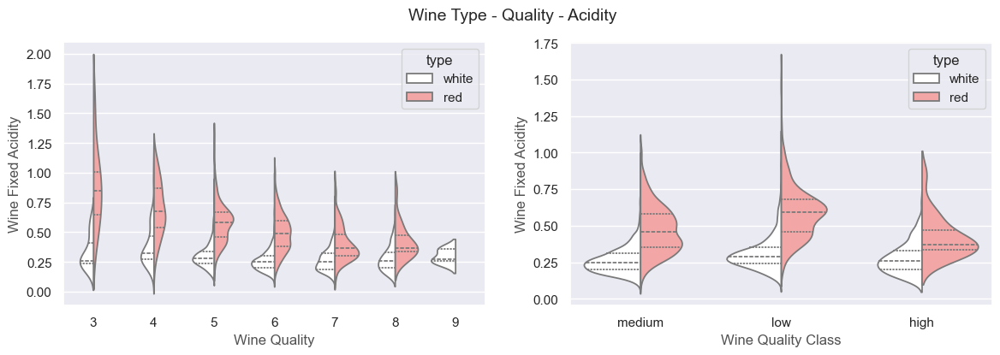

In [19]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Acidity', fontsize=14)

sns.violinplot(x='quality', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)

sns.violinplot(x='quality_label', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)
plt.show()

Совершенно очевидно, что образцы красного вина имеют более высокую кислотность по сравнению с аналогами белого вина. Также мы можем видеть общее снижение кислотности при более качественном вине для образцов красного вина, но не так сильно для образцов белого вина. Давайте посмотрим на это наблюдение при анализе графиков с тремя переменными:


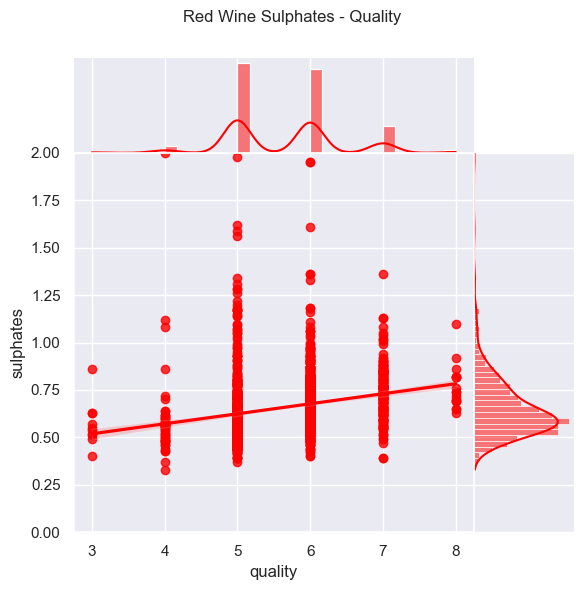

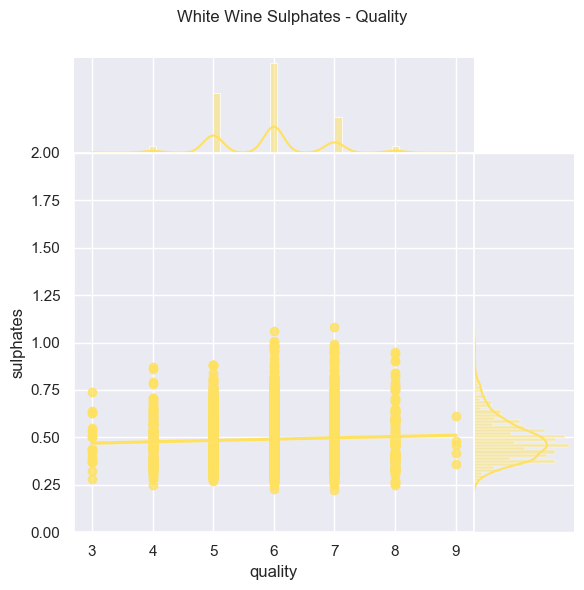

In [20]:
r = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 0], # , ax = ax
                  kind='reg', ylim=(0, 2), color='red', space=0, ratio=4)
r.ax_joint.set_xticks(list(range(3,9)))
rfig = r.fig 
rfig.subplots_adjust(top=0.9)
t = rfig.suptitle('Red Wine Sulphates - Quality', fontsize=12)

w = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 1],
                  kind='reg', ylim=(0, 2), color='#FFE160', space=0, ratio=4)
w.ax_joint.set_xticks(list(range(3,10)))
wfig = w.fig 
wfig.subplots_adjust(top=0.9)
t = wfig.suptitle('White Wine Sulphates - Quality', fontsize=12)

Хотя кажется, что существует некоторая закономерность, указывающая на небольшое повышение уровня сульфатов в образцах вина с более высоким рейтингом, корреляция довольно слабая. Однако мы видим, что эта тенденция вызвана большей концентрацией на среднем качестве, и ясно видим, что уровни сульфатов в красном вине намного выше по сравнению с уровнями в белом вине. Давайте посмотрим на это наблюдение при анализе некоторых графиков с четырьмя переменными:


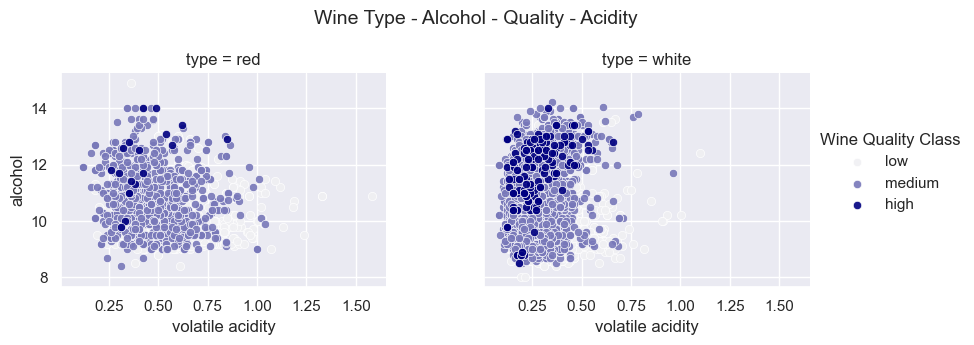

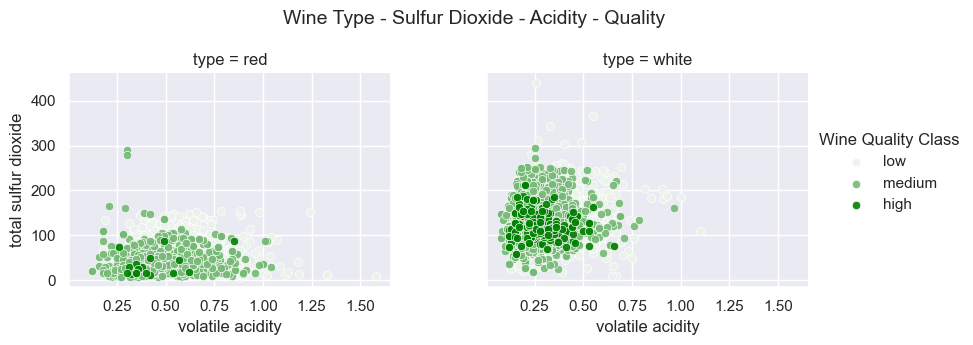

In [21]:
g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, height=3.5, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, 'volatile acidity', 'alcohol', alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Acidity', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, height=3.5, palette=sns.light_palette('green', 3))
g.map(plt.scatter, "volatile acidity", "total sulfur dioxide", alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig 
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Sulfur Dioxide - Acidity - Quality', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

Из первых парных графиков видно, что образцы вин более высокого качества имеют более низкий уровень летучей кислотности и более высокий уровень содержания алкоголя по сравнению с образцами вин со средним и низким рейтингом. Помимо этого, мы также можем видеть, что уровень летучей кислотности в образцах белого вина немного ниже, чем в образцах красного вина. На втором парном графике летучая кислотность, а также общее содержание диоксида серы значительно ниже в образцах вина высокого качества. Кроме того, общее содержание диоксида серы в образцах белого вина значительно больше, чем в образцах красного вина. Однако уровни летучей кислотности немного ниже в образцах белого вина по сравнению с образцами красного вина, которые мы также наблюдали на предыдущем графике.


Инженерия данных — очистка, преобразование, выбор и сокращение


In [22]:
numeric_features = list(wines.dtypes[(wines.dtypes != "str") & (wines.dtypes !='object')].index)
numeric_features.remove('color')

skewed_features = wines[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    wines[feat], l_opt[feat] = boxcox((wines[feat]+1))

skewed_features2 = wines[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 6 higest skewed numerical features to box cox transform


,Skew,New Skew
chlorides,5.402178,0.188541
sulphates,1.802523,0.010381
fixed acidity,1.721248,-0.062754
volatile acidity,1.499692,0.113617
residual sugar,1.436792,0.136151
free sulfur dioxide,1.223143,-0.036825


Как видите, на первых порах нам удалось приблизить большинство числовых значений к норме. Возможно, вы не удовлетворены результатами и хотите понять, действительно ли нам нужно продолжать преобразование некоторых дискретных данных. Итак, давайте посмотрим на QQ-тест этих функций.


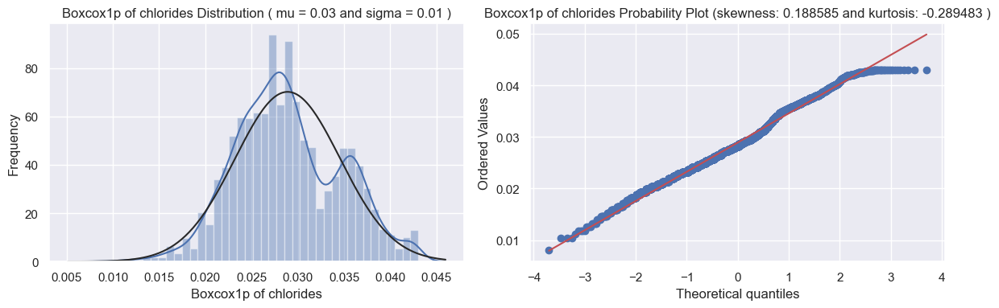

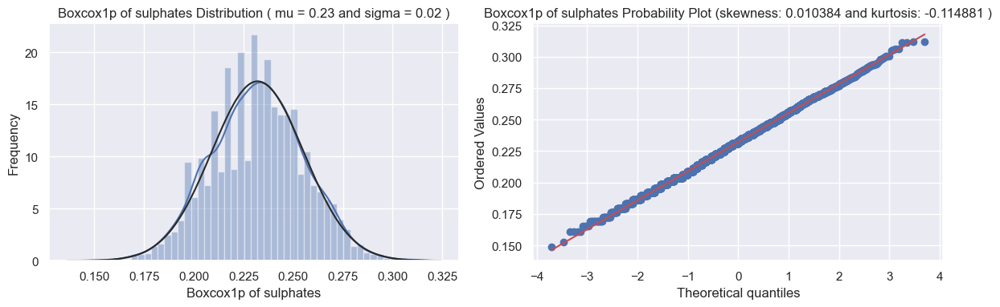

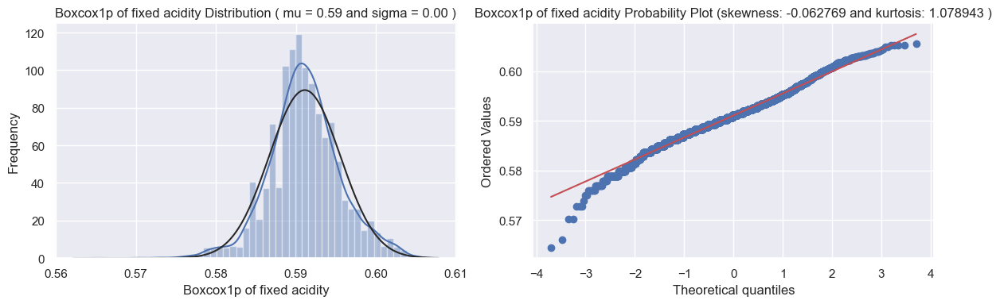

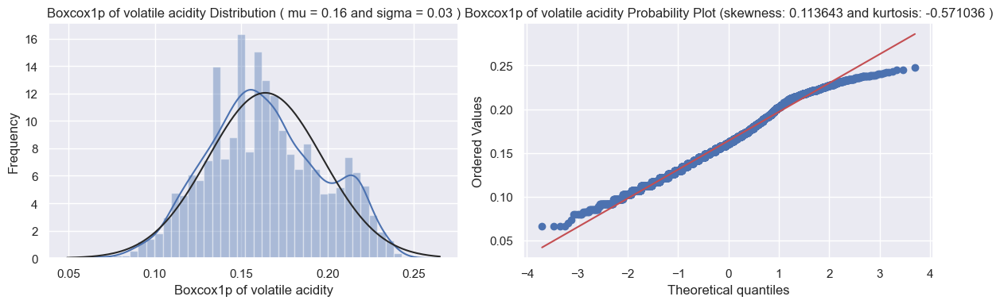

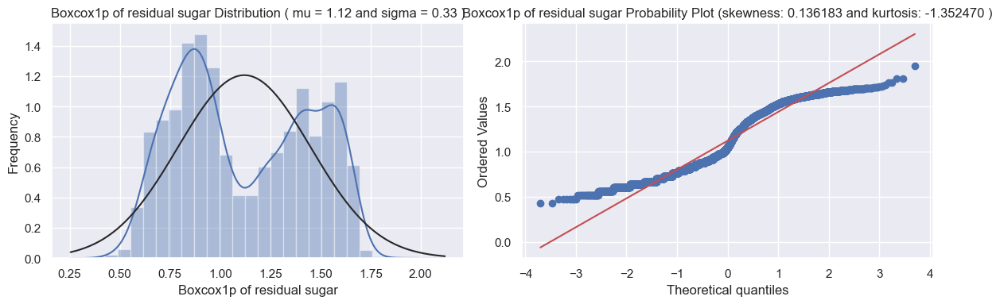

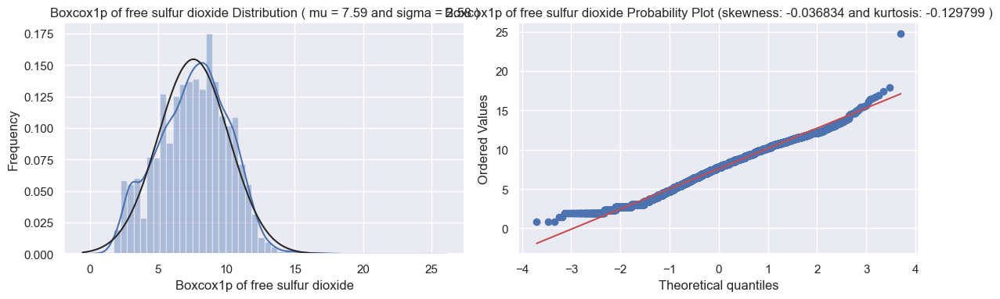

In [23]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(wines[feat], ('Boxcox1p of {}'.format(feat)))

Как видите, они не только продемонстрировали значительные улучшения, но и прошли тест QQ и демонстрируют интересные распределения, которые мы можем наблюдать на их соответствующих графиках. Итак, мы можем продолжать применять BoxCox к этим функциям.


In [24]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [25]:
def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['quality_label'] = y.values

    # get y and X dataframes based on this regression:
    y, X = dmatrices(predict + ' ~' + features, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the not applied to the qualty classification task
cols = list(cols.drop(['type', 'quality_label', 'quality']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

,VIF Factor,features
0,1.000000,Intercept
3,1.456483,citric_acid
10,1.459199,sulphates
2,1.913981,volatile_acidity
9,1.922427,pH
6,2.496617,free_sulfur_dioxide
5,2.561999,chlorides
1,2.726160,fixed_acidity
11,3.658381,alcohol
4,3.811469,residual_sugar


Удалим остаточный сахар и общий диоксид серы.

In [26]:
cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the higest correlations and run a multiple regression
cols = list(cols.drop(['type', 'quality_label', 'quality', 'residual_sugar', 'total_sulfur_dioxide']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

del df, vif

,VIF Factor,features
0,1.000000,Intercept
8,1.402620,sulphates
3,1.433664,citric_acid
5,1.532415,free_sulfur_dioxide
7,1.658454,pH
2,1.809226,volatile_acidity
1,2.254045,fixed_acidity
4,2.512481,chlorides
9,2.649799,alcohol
6,3.314295,density


Выбор функций в конвейер. 
Поскольку признаков у нас немного, может быть достаточно лишь удаления коллинеарности и мультиколлинеарности. Однако уровни коллинеарности и мультиколлинеарности низкие, и существуют модели, позволяющие справиться с этим. Затем интересно, что мы переходим к выбору переменных внутри конвейера, что позволяет нам решить, будет ли осуществляться выбор переменных и каким методом. Мы все еще можем улучшить результаты за счет гиперпараметризации и перекрестной проверки.


In [27]:
class select_fetaures(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        pass

    def transform(self, X):
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]

Давайте посмотрим, как PCA может уменьшить размерность нашего набора данных с минимумом потерь информации:

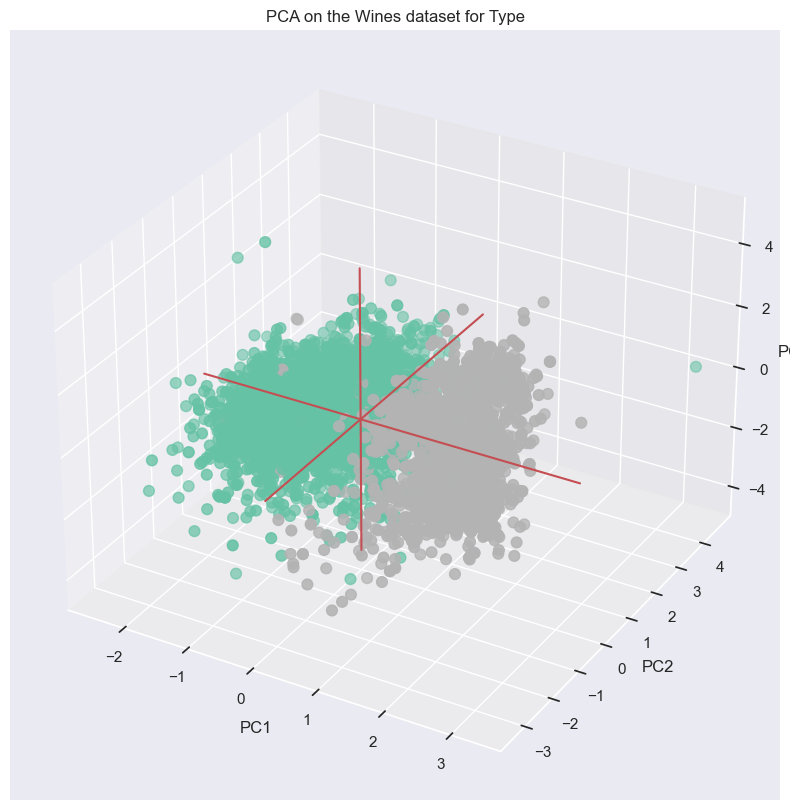

KNeighbors Classifier Training Accuracy: 99.98%
KNeighbors Classifier Test Accuracy: 99.33%
________________________________________

Accurance on Type  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
11,99.427453,0.999779,0.993811
10,97.667786,0.999779,0.993296
8,91.839268,0.999779,0.991748
9,95.160591,0.999779,0.990717
6,82.997327,0.999779,0.989170
7,87.723789,0.999779,0.989170
4,70.692560,0.999779,0.988138
5,77.709477,0.999779,0.987622
3,61.525143,0.999779,0.985560


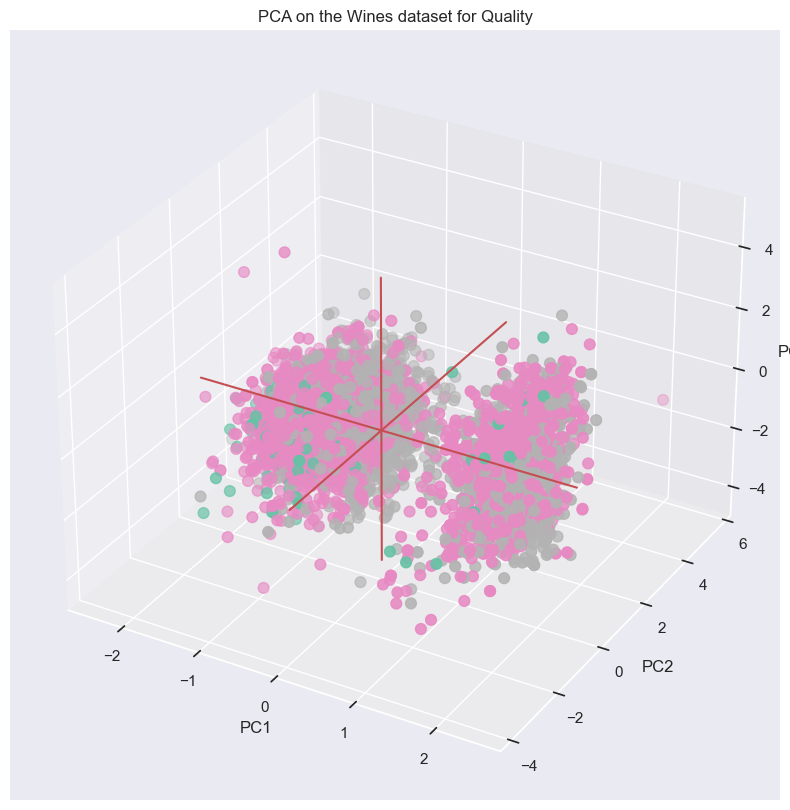

KNeighbors Classifier Training Accuracy: 100.00%
KNeighbors Classifier Test Accuracy: 78.29%
________________________________________

Accurance on Quality  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
10,98.577969,1.0,0.784425
11,99.485315,1.0,0.782878
6,85.704486,1.0,0.777205
9,96.547242,1.0,0.773079
8,93.557958,1.0,0.768437
5,80.594934,1.0,0.767922
7,90.053091,1.0,0.764827
4,74.622660,1.0,0.755028
3,66.550688,1.0,0.733368


In [28]:
def pca_analysis(df, y_train, feat):
    scale = StandardScaler()
    df = pd.DataFrame(scale.fit_transform(df), index=df.index)
    pca_all = PCA(random_state=101, whiten=True).fit(df)

    my_color=y_train

    # Store results of PCA in a data frame
    result=pd.DataFrame(pca_all.transform(df), columns=['PCA%i' % i for i in range(df.shape[1])], index=df.index)

    # Plot initialisation
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(result['PCA0'], result['PCA1'], result['PCA2'], c=my_color, cmap="Set2_r", s=60)

    # make simple, bare axis lines through space:
    xAxisLine = ((min(result['PCA0']), max(result['PCA0'])), (0, 0), (0,0))
    ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
    yAxisLine = ((0, 0), (min(result['PCA1']), max(result['PCA1'])), (0,0))
    ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
    zAxisLine = ((0, 0), (0,0), (min(result['PCA2']), max(result['PCA2'])))
    ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')

    # label the axes
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    ax.set_title("PCA on the Wines dataset for " + (feat))
    plt.show()

    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNeighbors Classifier Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNeighbors Classifier Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    print('_' * 40)
    print('\nAccurance on', feat, ' Prediction By Number of PCA COmponents:\n')
    AccPca = pd.DataFrame(columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc'])

    for componets in np.arange(1, df.shape[1]):
        variance_ratio = sum(pca_all.explained_variance_ratio_[:componets])*100
        pca = PCA(n_components=componets, random_state=101, whiten=True)
        X_train_pca = pca.fit_transform(X_train)
        Components = X_train_pca.shape[1]
        KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
        KNC = KNC.fit(X_train_pca, y)
        Training_Accuracy = accuracy_score(y, KNC.predict(X_train_pca))
        X_test_pca = pca.transform(X_test)
        y_pred = KNC.predict(X_test_pca)
        Test_Accuracy = accuracy_score(y_test, y_pred)
        AccPca = pd.concat([AccPca, pd.DataFrame([(Components, variance_ratio, Training_Accuracy, Test_Accuracy)],
                                         columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc'])])#], axis=0)

    AccPca.set_index('Components', inplace=True)
    display(AccPca.sort_values(by='Test_Acc', ascending=False))

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
pca_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
pca_analysis(wines.loc[:, cols], y_ql, 'Quality')

In [29]:
Линейный дискриминантный анализ (LDA) В качестве метода контролируемого уменьшения размерности для максимизации разделимости классов. 
LDA можно использовать в качестве метода извлечения признаков для повышения эффективности вычислений и уменьшения 
степени переобучения из-за проклятия размерности в нерегуляризованных моделях. 
Итак, цель состоит в том, чтобы найти подпространство признаков, которое оптимизирует разделимость классов.
Однако даже если одно или несколько из этих предположений слегка нарушены, 
LDA для уменьшения размерности все равно может работать достаточно хорошо.

SyntaxError: invalid syntax (3617270458.py, line 1)

KNC Training Accuracy: 99.98%
KNC Test Accuracy: 96.29%
________________________________________

Apply LDA:

Number of features after LDA: 1
LR Training Accuracy With LDA: 99.98%
LR Test Accuracy With LDA: 99.33%


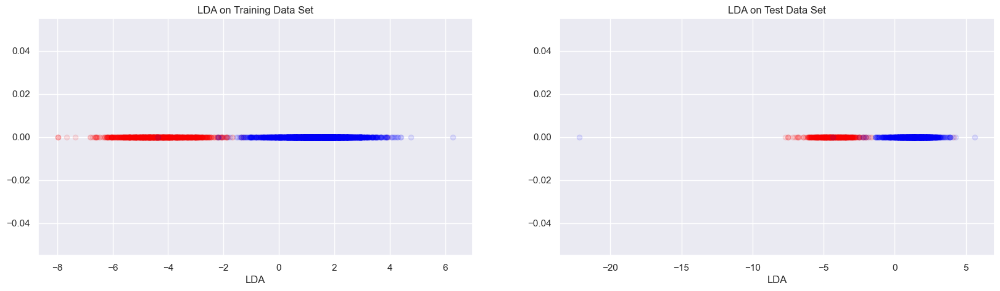

KNC Training Accuracy: 100.00%
KNC Test Accuracy: 73.70%
________________________________________

Apply LDA:

Number of features after LDA: 1
LR Training Accuracy With LDA: 100.00%
LR Test Accuracy With LDA: 75.61%


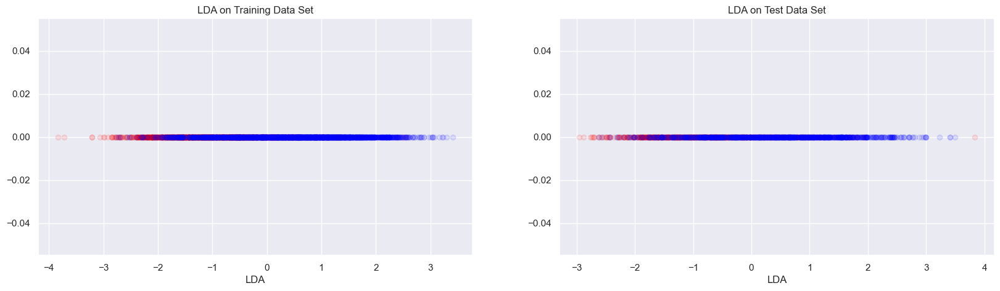

In [30]:
def LDA_analysis(df, y_train, feat):
    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNC Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNC Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))
    print('_' * 40)
    print('\nApply LDA:\n')
    lda = LDA(n_components=1, store_covariance=True)
    X_train_lda = lda.fit_transform(X_train, y)
    #X_train_lda = pd.DataFrame(X_train_lda)

    print('Number of features after LDA:',X_train_lda.shape[1])
    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNCr = KNC.fit(X_train_lda, y)
    print('LR Training Accuracy With LDA: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train_lda))))
    X_test_lda = lda.transform(X_test)
    y_pred = KNC.predict(X_test_lda)
    print('LR Test Accuracy With LDA: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    if X_train_lda.shape[1]==1:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], np.zeros((len(X_train_lda[y==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], np.zeros((len(X_train_lda[y==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], np.zeros((len(X_test_lda[y_test==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], np.zeros((len(X_test_lda[y_test==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')
    else:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], X_train_lda[y==0, 1], color='black', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], X_train_lda[y==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_train_lda[y==2, 0], X_train_lda[y==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], X_test_lda[y_test==0, 1], color='black', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], X_test_lda[y_test==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_test_lda[y_test==2, 0], X_test_lda[y_test==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')

    plt.show()
    
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
LDA_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
LDA_analysis(wines.loc[:, cols], y_ql, 'Quality')

In [31]:
def get_results(model, name, data, true_labels, target_names = ['red', 'white'], results=None, reasume=False):

    if hasattr(model, 'layers'):
        param = wtp_dnn_model.history.params
        best = np.mean(wtp_dnn_model.history.history['val_acc'])
        predicted_labels = model.predict_classes(data) 
        im_model = InMemoryModel(model.predict, examples=data, target_names=target_names)

    else:
        param = gs.best_params_
        best = gs.best_score_
        predicted_labels = model.predict(data).ravel()
        if hasattr(model, 'predict_proba'):
            im_model = InMemoryModel(model.predict_proba, examples=data, target_names=target_names)
        elif hasattr(clf, 'decision_function'):
            im_model = InMemoryModel(model.decision_function, examples=data, target_names=target_names)
        
    print('Mean Best Accuracy: {:2.2%}'.format(best))
    print('-'*60)
    print('Best Parameters:')
    print(param)
    print('-'*60)
    
    y_pred = model.predict(data).ravel()
    
    display_model_performance_metrics(true_labels, predicted_labels = predicted_labels, target_names = target_names)
    if len(target_names)==2:
        ras = roc_auc_score(y_true=true_labels, y_score=y_pred)
    else:
        roc_auc_multiclass, ras = roc_auc_score_multiclass(y_true=true_labels, y_score=y_pred, target_names=target_names)
        print('\nROC AUC Score by Classes:\n',roc_auc_multiclass)
        print('-'*60)

    print('\n\n              ROC AUC Score: {:2.2%}'.format(ras))
    prob, score_roc, roc_auc = plot_model_roc_curve(model, data, true_labels, label_encoder=None, class_names=target_names)
    
    interpreter = Interpretation(data, feature_names=cols)
    plots = interpreter.feature_importance.plot_feature_importance(im_model, progressbar=False, n_jobs=1, ascending=True)
    
    r1 = pd.DataFrame([(prob, best, np.round(accuracy_score(true_labels, predicted_labels), 4), 
                         ras, roc_auc)], index = [name],
                         columns = ['Prob', 'CV Accuracy', 'Accuracy', 'ROC AUC Score', 'ROC Area'])
    if reasume:
        results = r1
    elif (name in results.index):        
        results.loc[[name], :] = r1
    else: 
        results = results.append(r1)
        
    return results

def roc_auc_score_multiclass(y_true, y_score, target_names, average = "macro"):

  #creating a set of all the unique classes using the actual class list
  unique_class = set(y_true)
  roc_auc_dict = {}
  mean_roc_auc = 0
  for per_class in unique_class:
    #creating a list of all the classes except the current class 
    other_class = [x for x in unique_class if x != per_class]

    #marking the current class as 1 and all other classes as 0
    new_y_true = [0 if x in other_class else 1 for x in y_true]
    new_y_score = [0 if x in other_class else 1 for x in y_score]
    num_new_y_true = sum(new_y_true)

    #using the sklearn metrics method to calculate the roc_auc_score
    roc_auc = roc_auc_score(new_y_true, new_y_score, average = average)
    roc_auc_dict[target_names[per_class]] = np.round(roc_auc, 4)
    mean_roc_auc += num_new_y_true * np.round(roc_auc, 4)
    
  mean_roc_auc = mean_roc_auc/len(y_true)  
  return roc_auc_dict, mean_roc_auc

def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:  {:2.2%} '.format(metrics.accuracy_score(true_labels, predicted_labels)))
    print('Precision: {:2.2%} '.format(metrics.precision_score(true_labels, predicted_labels, average='weighted')))
    print('Recall:    {:2.2%} '.format(metrics.recall_score(true_labels, predicted_labels, average='weighted')))
    print('F1 Score:  {:2.2%} '.format(metrics.f1_score(true_labels, predicted_labels, average='weighted')))
                        

def train_predict_model(classifier,  train_features, train_labels,  test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    return predictions    


def display_confusion_matrix(true_labels, predicted_labels, target_names):
    
    total_classes = len(target_names)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], target_names], labels=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], target_names], labels=level_labels)) 
    print(cm_frame) 
    
def display_classification_report(true_labels, predicted_labels, target_names):

    report = metrics.classification_report(y_true=true_labels, y_pred=predicted_labels, target_names=target_names) 
    print(report)
    
def display_model_performance_metrics(true_labels, predicted_labels, target_names):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)


def plot_model_roc_curve(clf, features, true_labels, label_encoder=None, class_names=None):
    
    ## Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    if hasattr(clf, 'classes_'):
        class_labels = clf.classes_
    elif label_encoder:
        class_labels = label_encoder.classes_
    elif class_names:
        class_labels = class_names
    else:
        raise ValueError('Unable to derive prediction classes, please specify class_names!')
    n_classes = len(class_labels)
   
    if n_classes == 2:
        if hasattr(clf, 'predict_proba'):
            prb = clf.predict_proba(features)
            if prb.shape[1] > 1:
                y_score = prb[:, prb.shape[1]-1] 
            else:
                y_score = clf.predict(features).ravel()
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
        
        fpr, tpr, _ = roc_curve(true_labels, y_score)      
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label='ROC curve (area = {0:3.2%})'.format(roc_auc), linewidth=2.5)
        
    elif n_classes > 2:
        if  hasattr(clf, 'clfs_'):
            y_labels = label_binarize(true_labels, classes=list(range(len(class_labels))))
        else:
            y_labels = label_binarize(true_labels, classes=class_labels)
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(features)
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
            
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_labels[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        ## Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_labels.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        ## Compute macro-average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        ## Plot ROC curves
        plt.figure(figsize=(6, 4))
        plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["micro"]), linewidth=3)

        plt.plot(fpr["macro"], tpr["macro"], label='macro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["macro"]), linewidth=3)

        for i, label in enumerate(class_names):
            plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:2.2%})'
                                           ''.format(label, roc_auc[i]), linewidth=2, linestyle=':')
        roc_auc = roc_auc["macro"]   
    else:
        raise ValueError('Number of classes should be atleast 2 or more')
        
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.01])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    return prob, y_score, roc_auc

Модели классификатора типов вина:¶ Начнем с того, что попробуем классифицировать вина на красные и белые. Давайте подготовим наши данные с упором на тип вин и разделим наборы обучающих и тестовых данных для использования в следующих задачах.


In [32]:
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
X_train, X_test, y_train, y_test = train_test_split(wines.loc[:, cols], y_tp, test_size=0.20, random_state=101)

#### Logistic Regression
Since it is a binary classification task, we try first with a simple logistic regression.

This class implements regularized [logistic regression](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) using the 'liblinear' library, 'newton-cg', 'sag' and 'lbfgs' solvers. It can handle both dense and sparse input. 

**Main Parameters**
 - class_weight : dict or 'balanced', default: None
   The "balanced" mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as ``n_samples / (n_classes * np.bincount(y))``.

   For how class_weight works: It penalizes mistakes in samples of class[i] with class_weight[i] instead of 1. So higher class-weight means you want to put more emphasis on a class. For example, our class 0 is 1.24 times more frequent than class 1. So you should increase the class_weight of class 1 relative to class 0, say {1: 0.6, 0: 0.4}. If the class_weight doesn't sum to 1, it will basically change the regularization parameter.

   "balanced" basically means replicating the smaller class until you have as many samples as in the larger one, but in an implicit way.
   

 - warm_start : bool, default: False. Useless for liblinear solver.
 - ``'clf__multi_class' : ['ovr', 'multinomial']`` for ``'clf__solver': ['newton-cg', 'sag', 'lbfgs']``

**Attributes:**
 - coef_ : array, shape (1, n_features) or (n_classes, n_features)
 - intercept_ : array, shape (1,) or (n_classes,)
 - n_iter_ : array, shape (n_classes,) or (1, )

**See also:**
 - SGDClassifier : incrementally trained logistic regression (when given the parameter ``loss="log"``).
 - sklearn.svm.LinearSVC : learns SVM models using the same algorithm.
 
 See our the best results below with first model from a pipeline with grid search CV.


In [ ]:
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel

In [ ]:
clf = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('clf', LogisticRegression(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
n_components= [10, 12]
whiten = [True] #, False]
C =  [0.003, 0.009, 0.01]#, 0.1, 1.0, 10.0, 100.0, 1000.0]
tol = [0.001, 0.0001] # [1e-06, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01]

param_grid =\
    [{'clf__C': C
     ,'clf__solver': ['liblinear', 'saga'] 
     ,'clf__penalty': ['l1', 'l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': [None, 'balanced']
     ,'pca__n_components' : n_components
     ,'pca__whiten' : whiten
},
    {'clf__C': C
     ,'clf__max_iter': [3, 9, 2, 7, 4]
     ,'clf__solver': ['newton-cg', 'sag', 'lbfgs']
     ,'clf__penalty': ['l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': [None, 'balanced'] 
     ,'pca__n_components' : n_components
     ,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=1)
LR = Pipeline([
        #('sel', select_fetaures(select_cols=list(shadow))),
        ('scl', StandardScaler()),
        #('lda', LDA(store_covariance=True)),
        ('gs', gs)
 ]) 

LR.fit(X_train,y_train)

results = get_results(LR, 'LogisticRegression', X_test, y_test, reasume=True)

К сожелению не смог запустить. Не ставится skater.

Как видите, мы получили отличные результаты: производительность по всем показателям 99,38 и показатель ROC AUC 99,28%. Наиболее важными характеристиками являются общее содержание диоксида серы, плотность, содержание хлоридов и летучая кислотность. Эти результаты действительно достаточны и получены с помощью очень простой модели, но из любопытства мы отправим те же данные в классификатор глубоких нейронных сетей.


41/41 [==============================] - 0s 806us/step


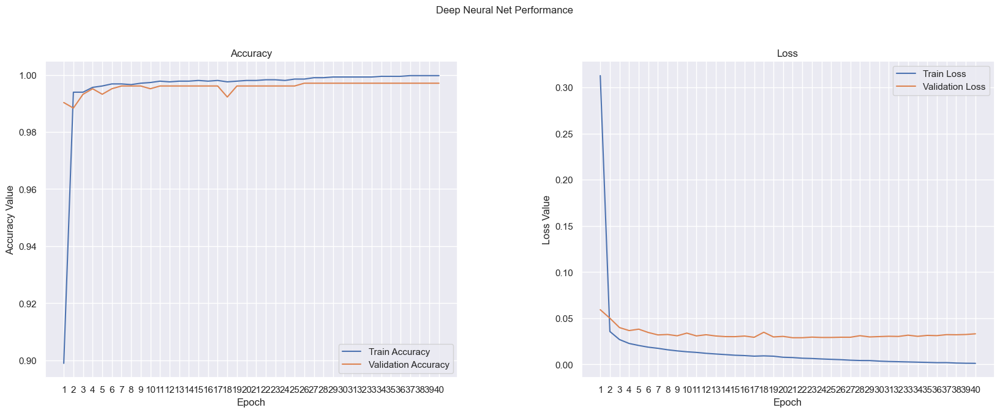

In [35]:
# Define the scaler 
wtp_ss = StandardScaler().fit(X_train)

# Scale the train set
X_train_Ss = wtp_ss.transform(X_train)

# Scale the test set
X_test_Ss = wtp_ss.transform(X_test)

wtp_dnn_model = Sequential()
wtp_dnn_model.add(Dense(64, activation='relu', input_shape=(12,)))
wtp_dnn_model.add(Dense(32, activation='relu'))
wtp_dnn_model.add(Dense(16, activation='relu'))
wtp_dnn_model.add(Dense(1, activation='sigmoid'))

wtp_dnn_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

epochs=40
history = wtp_dnn_model.fit(X_train_Ss, y_train, epochs=epochs, batch_size=50, 
                            shuffle=True, validation_split=0.2, verbose=0)

wtp_dnn_ypred = (wtp_dnn_model.predict(X_test_Ss) > 0.5).astype("int32")
wtp_dnn_predictions = class_tp.inverse_transform(wtp_dnn_ypred)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,epochs+1))
ax1.plot(epochs, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history.history['loss'], label='Train Loss')
ax2.plot(epochs, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

Из графика точности и потерь можно отметить, что мы можем остановить процесс обучения на 40-й или 23-й эпохе, учитывая, что в какой-то момент модель, похоже, имеет тенденцию к переобучению, если мы продолжим. Давайте возьмем наш стандартный отчет и проверим, могут ли модели DNN после 40-го числа дать нам хорошее обобщение.


In [38]:
from sklearn.linear_model import LogisticRegression

LR = LogisticRegression()
LR.fit(X_train, y_train)

LogisticRegression()

41/41 [==============================] - 0s 723us/step


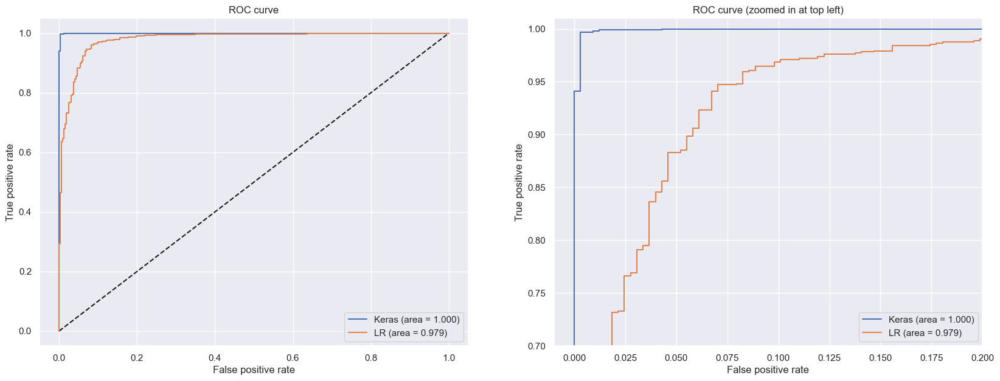

41/41 [==============================] - 0s 715us/step


,Model,Accuracy
1,Keras,0.995360
0,LR,0.949729


In [40]:
y_pred_keras = wtp_dnn_model.predict(X_test_Ss).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_keras)
auc_keras = auc(fpr_keras, tpr_keras)

y_pred_clf = LR.predict_proba(X_test)[:, 1]
fpr_clf, tpr_clf, thresholds_clf = roc_curve(y_test, y_pred_clf)
auc_clf = auc(fpr_clf, tpr_clf)

fig = plt.figure(figsize=(20, 7))
ax = fig.add_subplot(121)
ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax.set_xlabel('False positive rate')
ax.set_ylabel('True positive rate')
ax.set_title('ROC curve')
ax.legend(loc='best')

# Zoom in view of the upper left corner.
ax2 = fig.add_subplot(122)
ax2.set_xlim(-0.01, 0.2)
ax2.set_ylim(0.7, 1.01)
ax2.plot([0, 1], [0, 1], 'k--')
ax2.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax2.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax2.set_xlabel('False positive rate')
ax2.set_ylabel('True positive rate')
ax2.set_title('ROC curve (zoomed in at top left)')
ax2.legend(loc='best')
plt.show()

results = pd.DataFrame({
    'Model': ['LR', 'Keras'],
    'Accuracy': [accuracy_score(y_test, LR.predict(X_test)), 
                 accuracy_score(y_test, np.round(wtp_dnn_model.predict(X_test_Ss).ravel()))],
    # добавьте другие метрики результатов, если они у вас есть
})
display(results.sort_values(by='Accuracy', ascending=False))

К сожелению разобраться с дальнейшими моделями не смог. Мало знаний и опыта.